In [478]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime 
from sklearn import metrics
import folium

In [479]:
#Change the long unique values into 1 and 2
def change_to12(big_table,severity,col2,col3,new_col):
    lo=C_C[[severity,col2,col3]]
    T=lo.groupby([severity,col2]).count()
    TEST=pd.pivot_table(lo,index=lo[col2],columns=[severity],values=col3,aggfunc='count')
    TEST[[1,2]]=TEST[[1,2]].replace(to_replace=float('NaN'),value=50000)
    TEST[new_col]=TEST[1]/TEST[2]
    TEST[new_col][TEST[new_col]>=1]=int(1)
    TEST[new_col][TEST[new_col]<1]=int(0)
    TEST.drop(columns=[1,2],inplace=True)
    return TEST
#KNN, decision tree, logic regression and SVM
def JAF(test,hat):
    F1=metrics.f1_score(test,hat)
    ACC=metrics.accuracy_score(test,hat)
    JACC=metrics.jaccard_score(test,hat)
    loss=metrics.log_loss(test,hat)
    return [JACC,ACC,F1,loss]

In [480]:
collision=pd.read_csv('/Users/livi/Documents/Data Science Skills/Final Capstone project/Data-Collisions.csv')
print(collision[['ST_COLDESC','SDOT_COLDESC','SEVERITYDESC']].head())
print(collision.shape)
collision.drop(columns=['OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO','EXCEPTRSNCODE', 'EXCEPTRSNDESC','STATUS','SEVERITYCODE.1'],inplace=True)
collision.drop(columns=['ST_COLDESC','SDOT_COLDESC','SEVERITYDESC'],inplace=True)
collision.drop(columns=['PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT','HITPARKEDCAR'],inplace=True)
collision.drop(columns=['PEDROWNOTGRNT', 'SPEEDING', 'INATTENTIONIND'],inplace=True)
collision.drop(columns=['SDOTCOLNUM'],inplace=True)
print(collision.columns)
for col in collision:
    print(col,': ',len(collision[col].unique()))
collision.columns

ST_COLDESC  \
0                                  Entering at angle   
1  From same direction - both going straight - bo...   
2                             One parked--one moving   
3                   From same direction - all others   
4                                  Entering at angle   

                                        SDOT_COLDESC  \
0  MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...   
1  MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...   
2       MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END   
3  MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...   
4  MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...   

                     SEVERITYDESC  
0                Injury Collision  
1  Property Damage Only Collision  
2  Property Damage Only Collision  
3  Property Damage Only Collision  
4                Injury Collision  
(194673, 38)
Index(['SEVERITYCODE', 'X', 'Y', 'ADDRTYPE', 'INTKEY', 'LOCATION',
       'COLLISIONTYPE', 'INCDATE', 'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLC

Index(['SEVERITYCODE', 'X', 'Y', 'ADDRTYPE', 'INTKEY', 'LOCATION',
       'COLLISIONTYPE', 'INCDATE', 'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE',
       'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'ST_COLCODE',
       'SEGLANEKEY', 'CROSSWALKKEY'],
      dtype='object')

In [481]:
C_C=collision

In [482]:
for col in ['LIGHTCOND','ROADCOND', 'WEATHER']:
    C_C[col].replace(to_replace=['Unknown'],value=[float('NaN')],inplace=True)
for col in ['ST_COLCODE','UNDERINFL']:
    C_C[col].replace(to_replace=['N','Y','0','1'],value=[int(0),int(1),int(0),int(1)],inplace=True)

C_C['INCDATE']=pd.to_datetime(C_C['INCDATE'])
C_C['MONTH']=C_C['INCDATE'].dt.month
C_C['DAY']=C_C['INCDATE'].dt.day
C_C['DOW']=C_C['INCDATE'].dt.dayofweek

C_C['HOUR']=C_C['INCDTTM'].str.extract('(\d{1,2}:\d\d:\d\d ..)')
C_C['HOUR']=C_C['HOUR'].str.pad(width=11,side='left',fillchar='0')
C_C['HOUR']=pd.to_datetime(C_C['HOUR']).dt.hour
C_C.drop(['INCDATE','INCDTTM'],axis=1,inplace=True)

C_C.dropna(inplace=True)
C_C.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53458 entries, 0 to 194671
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SEVERITYCODE   53458 non-null  int64  
 1   X              53458 non-null  float64
 2   Y              53458 non-null  float64
 3   ADDRTYPE       53458 non-null  object 
 4   INTKEY         53458 non-null  float64
 5   LOCATION       53458 non-null  object 
 6   COLLISIONTYPE  53458 non-null  object 
 7   JUNCTIONTYPE   53458 non-null  object 
 8   SDOT_COLCODE   53458 non-null  int64  
 9   UNDERINFL      53458 non-null  float64
 10  WEATHER        53458 non-null  object 
 11  ROADCOND       53458 non-null  object 
 12  LIGHTCOND      53458 non-null  object 
 13  ST_COLCODE     53458 non-null  object 
 14  SEGLANEKEY     53458 non-null  int64  
 15  CROSSWALKKEY   53458 non-null  int64  
 16  MONTH          53458 non-null  int64  
 17  DAY            53458 non-null  int64  
 18  DOW  

In [483]:
C_C[C_C['LIGHTCOND']=='Daylight'].sort_values('HOUR').head()

,SEVERITYCODE,X,Y,ADDRTYPE,INTKEY,LOCATION,COLLISIONTYPE,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,SEGLANEKEY,CROSSWALKKEY,MONTH,DAY,DOW,HOUR
61648,1,-122.330908,47.555643,Intersection,33145.0,3RD AVE S AND S DAWSON ST,Angles,At Intersection (intersection related),11,0.0,Overcast,Dry,Daylight,10,0,0,6,17,1,0.0
53020,1,-122.337544,47.606122,Intersection,29611.0,1ST AVE AND SENECA ST,Other,At Intersection (intersection related),14,0.0,Clear,Dry,Daylight,23,0,0,10,10,2,0.0
44166,2,-122.321439,47.547503,Intersection,33135.0,CORSON AVE S AND S MICHIGAN ST,Other,At Intersection (intersection related),26,0.0,Clear,Dry,Daylight,50,0,0,7,22,5,0.0
185303,2,-122.324749,47.605555,Intersection,29959.0,9TH AVE AND JAMES ST,Sideswipe,At Intersection (intersection related),11,1.0,Clear,Dry,Daylight,11,0,0,7,11,2,0.0
146635,1,-122.312772,47.614499,Intersection,30136.0,15TH AVE AND E MADISON ST,Left Turn,At Intersection (intersection related),11,0.0,Overcast,Dry,Daylight,28,0,0,11,16,0,0.0


In [484]:
Count_Sev=C_C.groupby('SEVERITYCODE').count()[['LOCATION']]
Count_Sev_rm_leng=int(Count_Sev.iloc[0]-Count_Sev.iloc[1])
Count_Sev_rm_leng

import random
SEV1=C_C[C_C['SEVERITYCODE']==1]
C_C.drop(index=random.sample(SEV1.index.tolist(), Count_Sev_rm_leng),inplace=True)
C_C.reset_index(drop=True)
Count_Sev=C_C.groupby('SEVERITYCODE').count()[['LOCATION']]

In [485]:
C_C.info()
for col in C_C:
    print(col,':',len(C_C[col].unique()))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47104 entries, 0 to 194671
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SEVERITYCODE   47104 non-null  int64  
 1   X              47104 non-null  float64
 2   Y              47104 non-null  float64
 3   ADDRTYPE       47104 non-null  object 
 4   INTKEY         47104 non-null  float64
 5   LOCATION       47104 non-null  object 
 6   COLLISIONTYPE  47104 non-null  object 
 7   JUNCTIONTYPE   47104 non-null  object 
 8   SDOT_COLCODE   47104 non-null  int64  
 9   UNDERINFL      47104 non-null  float64
 10  WEATHER        47104 non-null  object 
 11  ROADCOND       47104 non-null  object 
 12  LIGHTCOND      47104 non-null  object 
 13  ST_COLCODE     47104 non-null  object 
 14  SEGLANEKEY     47104 non-null  int64  
 15  CROSSWALKKEY   47104 non-null  int64  
 16  MONTH          47104 non-null  int64  
 17  DAY            47104 non-null  int64  
 18  DOW  

SEVERITYCODE      1      2
ADDRTYPE                  
Intersection  23552  23552


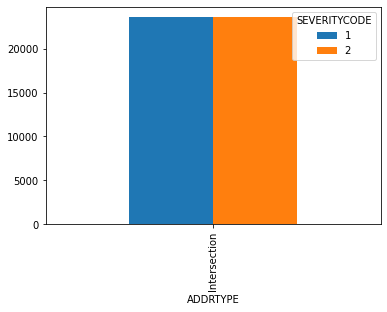

SEVERITYCODE       1      2
COLLISIONTYPE              
Angles         11269  10276
Cycles           227   2415
Head On          196    136
Left Turn       4505   3986
Other           1858    824


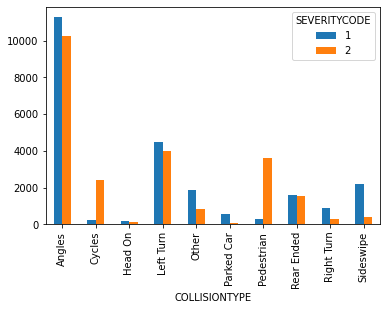

SEVERITYCODE     1     2
MONTH                   
1             2053  1992
2             1800  1569
3             2091  2000
4             1885  1891
5             2009  2090


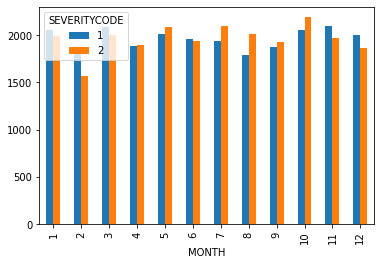

SEVERITYCODE    1    2
DAY                   
1             507  505
2             500  542
3             537  487
4             513  487
5             532  513


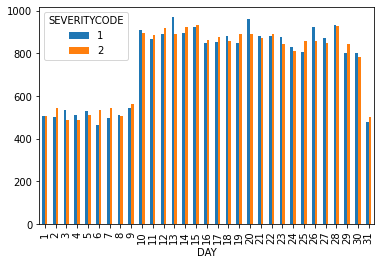

SEVERITYCODE     1     2
DOW                     
0             3120  3342
1             3497  3513
2             3505  3629
3             3480  3583
4             4025  3847


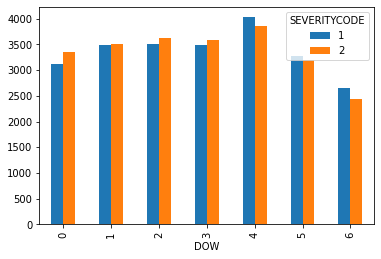

SEVERITYCODE    1    2
HOUR                  
0.0           436  364
1.0           406  331
2.0           395  325
3.0           174  117
4.0           121  100


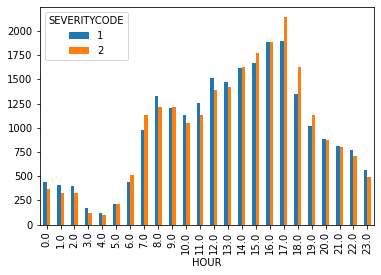

SEVERITYCODE                                             1        2
JUNCTIONTYPE                                                       
At Intersection (but not related to intersection)    872.0    544.0
At Intersection (intersection related)             22666.0  23000.0
Mid-Block (not related to intersection)                NaN      1.0
Ramp Junction                                         13.0      7.0
Unknown                                                1.0      NaN


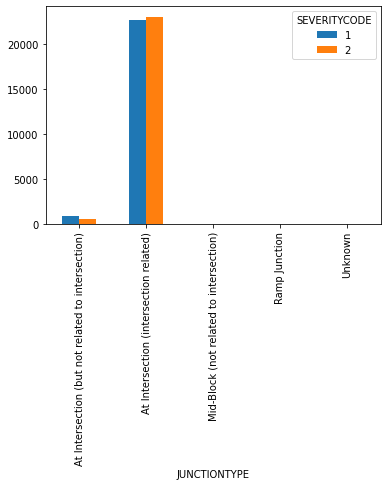

SEVERITYCODE        1        2
SDOT_COLCODE                  
0               130.0    135.0
11            18142.0  14715.0
12                5.0      3.0
13               21.0      1.0
14             2920.0   2182.0


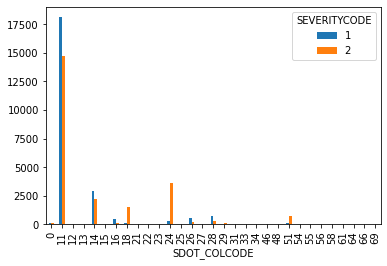

SEVERITYCODE      1      2
UNDERINFL                 
0.0           22821  22562
1.0             731    990


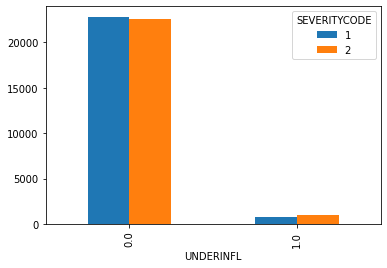

SEVERITYCODE             1        2
WEATHER                            
Blowing Sand/Dirt      3.0      6.0
Clear              14770.0  15064.0
Fog/Smog/Smoke        72.0     77.0
Other                 32.0     22.0
Overcast            3760.0   3556.0


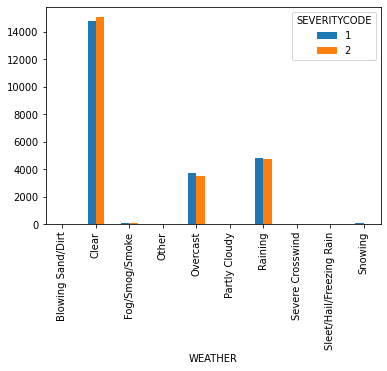

SEVERITYCODE       1      2
ROADCOND                   
Dry            16500  16789
Ice               95     59
Oil                3      4
Other              8      9
Sand/Mud/Dirt      7      4


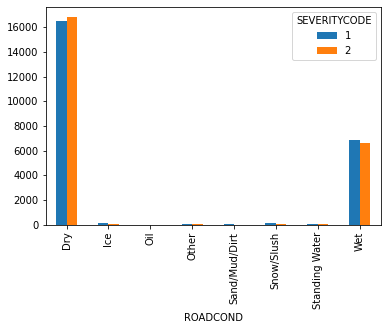

SEVERITYCODE                 1     2
LIGHTCOND                           
Dark - No Street Lights    129   104
Dark - Street Lights Off   127   140
Dark - Street Lights On   6231  5993
Dark - Unknown Lighting      1     3
Dawn                       321   371


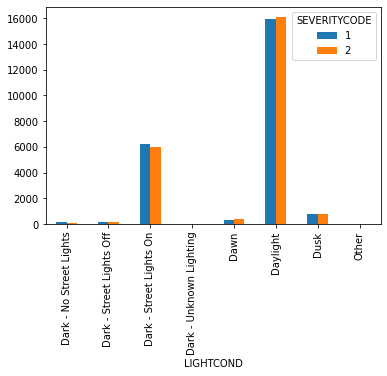

SEVERITYCODE      1       2
ST_COLCODE                 
0             101.0  1139.0
1              80.0   782.0
2              31.0   414.0
3               2.0    18.0
4               NaN     5.0


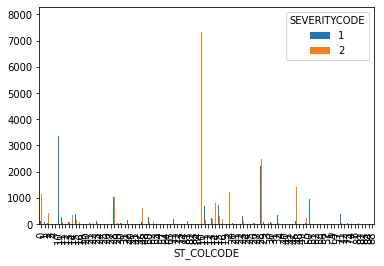

In [486]:
for i in C_C[['ADDRTYPE','COLLISIONTYPE', 'MONTH', 'DAY','DOW','HOUR', 'JUNCTIONTYPE', 'SDOT_COLCODE',
       'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND','ST_COLCODE']]:
       df=pd.concat([C_C[['SEVERITYCODE','SEGLANEKEY']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='SEGLANEKEY',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       TEST.plot(kind='bar')
       plt.show()

In [487]:
C_C.columns

Index(['SEVERITYCODE', 'X', 'Y', 'ADDRTYPE', 'INTKEY', 'LOCATION',
       'COLLISIONTYPE', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'UNDERINFL', 'WEATHER',
       'ROADCOND', 'LIGHTCOND', 'ST_COLCODE', 'SEGLANEKEY', 'CROSSWALKKEY',
       'MONTH', 'DAY', 'DOW', 'HOUR'],
      dtype='object')

In [488]:
# scatter plot of the location that accidient will happen
temp=C_C[['SEVERITYCODE', 'X', 'Y','LOCATION','DOW']]
coun=pd.DataFrame(temp.groupby(['SEVERITYCODE', 'X', 'Y','LOCATION']).count()['DOW'])
coun=coun.reset_index()
coun1=coun[coun['SEVERITYCODE']==1].sort_values('DOW',ascending=False).reset_index(drop=True)
coun2=coun[coun['SEVERITYCODE']==2].sort_values('DOW',ascending=False).reset_index(drop=True)
coun1.head()
coun2.head()
#coun.sort_values('DOW',ascending=False,inplace=True)
#coun1.head(100).sort_values('LOCATION').head(50)

,SEVERITYCODE,X,Y,LOCATION,DOW
0,2,-122.328079,47.604161,6TH AVE AND JAMES ST,95
1,2,-122.332451,47.607266,5TH AVE AND SPRING ST,61
2,2,-122.328913,47.613466,BOREN AVE AND PIKE ST,59
3,2,-122.316733,47.612889,12TH AVE AND E MADISON ST,57
4,2,-122.277664,47.551176,RAINIER AVE S AND S ORCAS ST,53


In [489]:
coun.head()

,SEVERITYCODE,X,Y,LOCATION,DOW
0,1,-122.418139,47.574598,BEACH DR SW AND BENTON PL SW,1
1,1,-122.414187,47.650474,MAGNOLIA BLVD W AND W BERTONA ST,2
2,1,-122.413404,47.574136,63RD AVE SW AND SW HINDS ST,1
3,1,-122.413350,47.575943,63RD AVE SW AND SW ADMIRAL WAY,2
4,1,-122.413281,47.578356,63RD AVE SW AND ALKI AVE SW,1


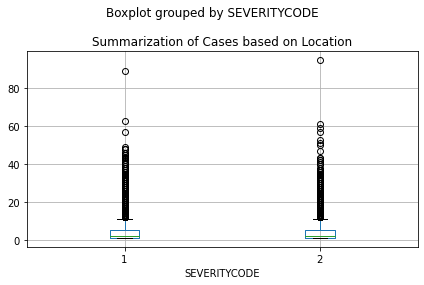

In [490]:

coun.boxplot(by='SEVERITYCODE',column='DOW')
plt.title('Summarization of Cases based on Location')
plt.tight_layout()
plt.savefig('Summary of cases based on location')
plt.show()

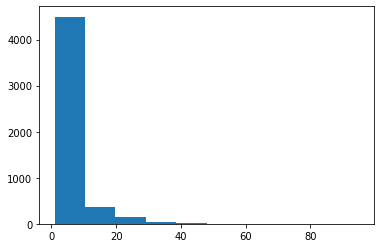

In [491]:
plt.hist(coun2['DOW'])
plt.show()

In [492]:
print(coun1.describe())
print(coun2.describe())
print(1.5*(coun1['DOW'].quantile(0.75)-coun1['DOW'].quantile(0.25))+coun1['DOW'].quantile(0.75))
print(1.5*(coun2['DOW'].quantile(0.75)-coun2['DOW'].quantile(0.25))+coun2['DOW'].quantile(0.75))

SEVERITYCODE            X            Y          DOW
count        5547.0  5547.000000  5547.000000  5547.000000
mean            1.0  -122.331581    47.622191     4.245899
std             0.0     0.033714     0.059690     6.011718
min             1.0  -122.418139    47.495573     1.000000
25%             1.0  -122.356681    47.571522     1.000000
50%             1.0  -122.329060    47.622065     2.000000
75%             1.0  -122.306668    47.672167     5.000000
max             1.0  -122.241082    47.734141    89.000000
       SEVERITYCODE            X            Y          DOW
count        5053.0  5053.000000  5053.000000  5053.000000
mean            2.0  -122.332654    47.624486     4.660993
std             0.0     0.033331     0.058960     6.224716
min             2.0  -122.414782    47.495989     1.000000
25%             2.0  -122.356739    47.575254     1.000000
50%             2.0  -122.330929    47.624289     2.000000
75%             2.0  -122.308845    47.673709     5.000000
max 

In [493]:
m=folium.Map(location=[47.618233, -122.286167],zoom_start=11,tiles='OpenStreetMap')

for i in range(100):
    folium.CircleMarker(location=[coun1['Y'][i], coun1['X'][i]], radius=int(coun1['DOW'][i])/5,fill_color='#3186cc',popup=str(coun1['DOW'][i]),fill=True,color='#3186cc').add_to(m)
    
    folium.CircleMarker(location=[coun2['Y'][i], coun2['X'][i]], radius=int(coun2['DOW'][i])/5,fill_color='#DC143C',popup=str(coun2['DOW'][i]),fill=True,color='#DC143C').add_to(m)

m

In [494]:
X_X=change_to12(C_C,'SEVERITYCODE','X','DOW','X_index')
Y_Y=change_to12(C_C,'SEVERITYCODE','Y','DOW','Y_index')
Loca=change_to12(C_C,'SEVERITYCODE','LOCATION','DOW','LOC_index')
INTK=change_to12(C_C,'SEVERITYCODE','INTKEY','DOW','INTK_index')
Seg=change_to12(C_C,'SEVERITYCODE','SEGLANEKEY','DOW','SEG_index')
Cross=change_to12(C_C,'SEVERITYCODE','CROSSWALKKEY','DOW','CROSS_index')

C_C=pd.merge(C_C,X_X,on='X', how='left')
C_C=pd.merge(C_C,Y_Y,on='Y', how='left')
C_C=pd.merge(C_C,Loca,on='LOCATION', how='left')
C_C=pd.merge(C_C,INTK,on='INTKEY', how='left')
C_C=pd.merge(C_C,Seg,on='SEGLANEKEY', how='left')
C_C=pd.merge(C_C,Cross,on='CROSSWALKKEY', how='left')

C_C.drop(columns=['X','Y','LOCATION','INTKEY','SEGLANEKEY','CROSSWALKKEY'],inplace=True)
C_C.head()

,SEVERITYCODE,ADDRTYPE,COLLISIONTYPE,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,MONTH,DAY,DOW,HOUR,X_index,Y_index,LOC_index,INTK_index,SEG_index,CROSS_index
0,2,Intersection,Angles,At Intersection (intersection related),11,0.0,Overcast,Wet,Daylight,10,3,27,2,14.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2,Intersection,Angles,At Intersection (intersection related),11,0.0,Raining,Wet,Daylight,10,1,28,2,8.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1,Intersection,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,4,20,5,17.0,1.0,1.0,1.0,1.0,1.0,1.0
3,2,Intersection,Cycles,At Intersection (intersection related),51,0.0,Clear,Dry,Daylight,5,4,15,2,17.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2,Intersection,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,3,20,0,15.0,1.0,1.0,1.0,1.0,1.0,1.0


In [495]:
C_C.shape
for col in C_C:
    print(C_C[col].unique())

[2 1]
['Intersection']
['Angles' 'Cycles' 'Rear Ended' 'Left Turn' 'Parked Car' 'Other'
 'Pedestrian' 'Head On' 'Right Turn' 'Sideswipe']
['At Intersection (intersection related)'
 'At Intersection (but not related to intersection)' 'Ramp Junction'
 'Mid-Block (not related to intersection)' 'Unknown']
[11 51 14 34 28 24 18 26 16 29  0 25 27 31 64 13 21 15 48 58 12 23 33 46
 22 69 55 54 61 66 56]
[0. 1.]
['Overcast' 'Raining' 'Clear' 'Snowing' 'Fog/Smog/Smoke'
 'Sleet/Hail/Freezing Rain' 'Other' 'Blowing Sand/Dirt' 'Severe Crosswind'
 'Partly Cloudy']
['Wet' 'Dry' 'Ice' 'Other' 'Oil' 'Snow/Slush' 'Standing Water'
 'Sand/Mud/Dirt']
['Daylight' 'Dark - Street Lights On' 'Dusk' 'Dawn'
 'Dark - Street Lights Off' 'Dark - No Street Lights' 'Other'
 'Dark - Unknown Lighting']
['10' '5' '14' '28' '32' '50' 0 '45' 1 '30' '15' '51' '19' '2' '16' '81'
 '12' '3' '52' '24' '40' '11' '71' '13' '6' '83' '23' '74' '27' '29' '26'
 '21' '20' '22' '25' '49' '73' '84' '82' '4' '72' '53' 10 28 50 20 16 83


In [496]:
C_C.shape

(47104, 20)

In [497]:
C_C.columns
C_C.drop(columns=['ADDRTYPE'],inplace=True)
for col in C_C:
    print(col,':',len(C_C[col].unique()))

SEVERITYCODE : 2
COLLISIONTYPE : 10
JUNCTIONTYPE : 5
SDOT_COLCODE : 31
UNDERINFL : 2
WEATHER : 10
ROADCOND : 8
LIGHTCOND : 8
ST_COLCODE : 96
MONTH : 12
DAY : 31
DOW : 7
HOUR : 24
X_index : 2
Y_index : 2
LOC_index : 2
INTK_index : 2
SEG_index : 2
CROSS_index : 2


SEVERITYCODE     1     2
MONTH                   
1             2053  1992
2             1800  1569
3             2091  2000
4             1885  1891
5             2009  2090


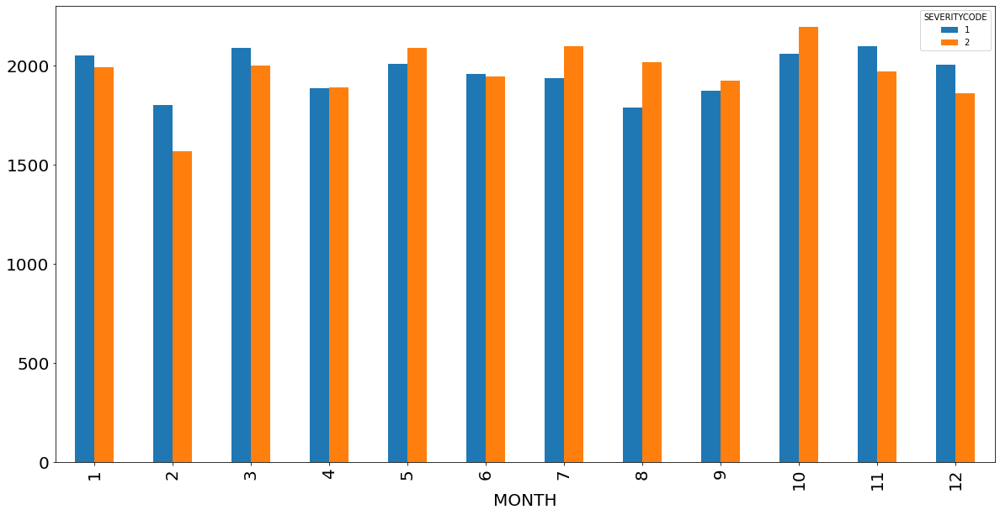

SEVERITYCODE     1     2
DOW                     
0             3120  3342
1             3497  3513
2             3505  3629
3             3480  3583
4             4025  3847


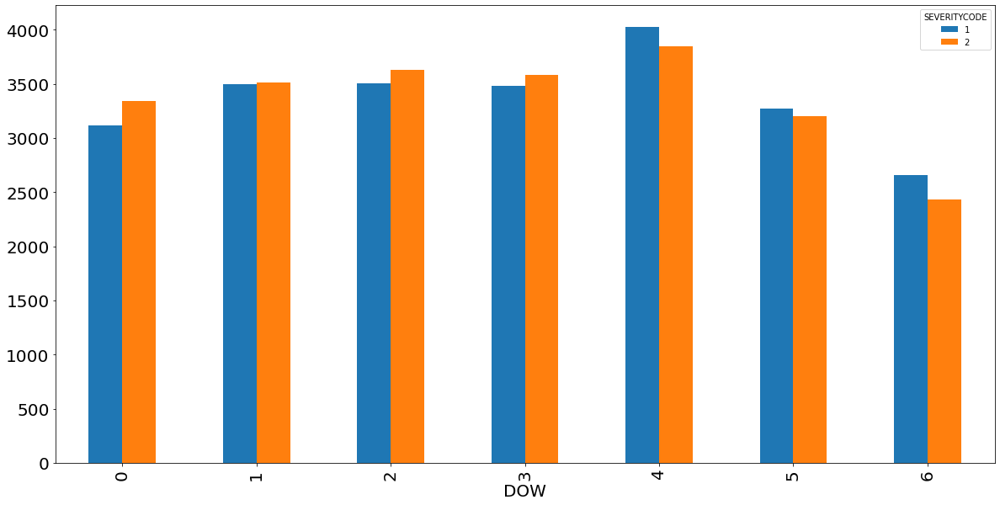

SEVERITYCODE    1    2
HOUR                  
0.0           436  364
1.0           406  331
2.0           395  325
3.0           174  117
4.0           121  100


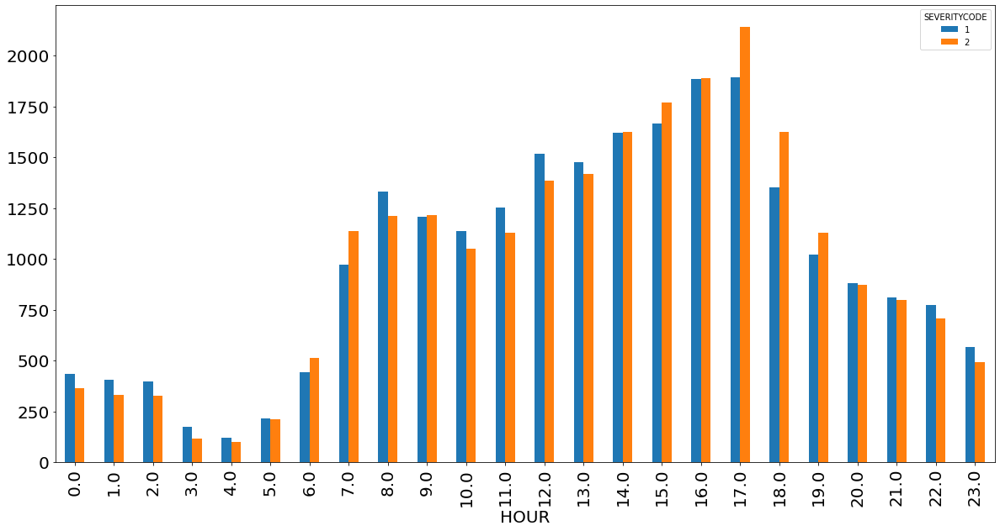

SEVERITYCODE    1    2
DAY                   
1             507  505
2             500  542
3             537  487
4             513  487
5             532  513


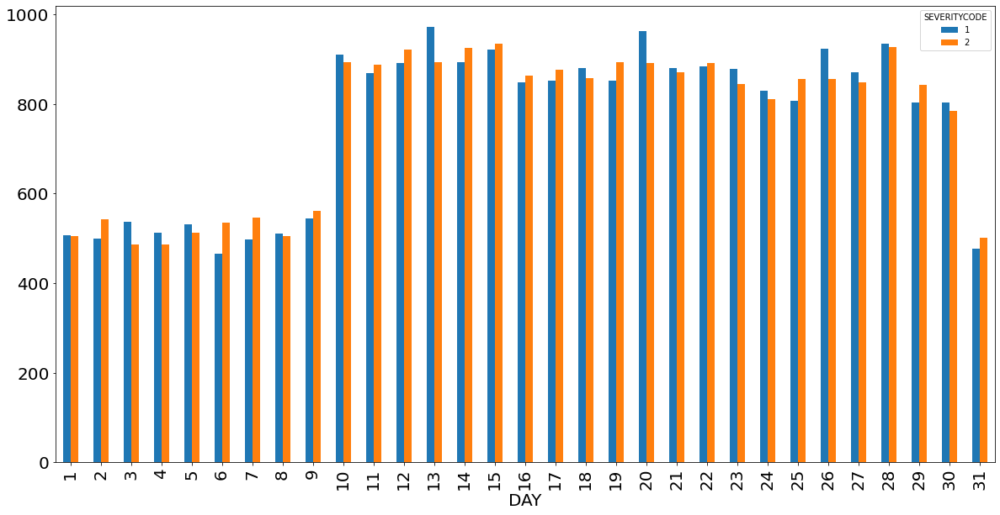

In [498]:
for i in C_C[['MONTH', 'DOW', 'HOUR','DAY']]:
       df=pd.concat([C_C[['SEVERITYCODE','X_index']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='X_index',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       
       TEST.plot(kind='bar',figsize=(20,10),stacked=False)
       plt.yticks(size=20)
       plt.xlabel(i,size=20)
       plt.xticks(size=20)
       plt.savefig(i)
       plt.show()


SEVERITYCODE      1      2
UNDERINFL                 
0.0           22821  22562
1.0             731    990


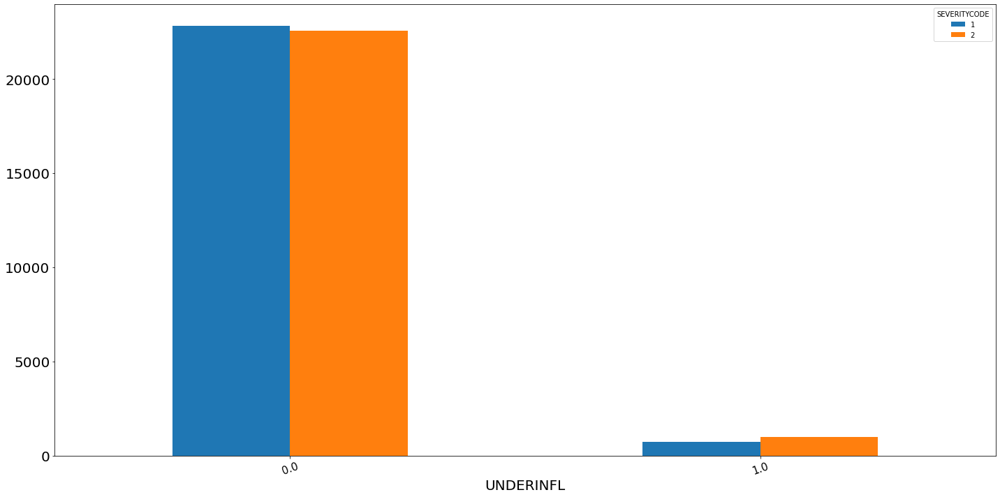

SEVERITYCODE             1        2
WEATHER                            
Blowing Sand/Dirt      3.0      6.0
Clear              14770.0  15064.0
Fog/Smog/Smoke        72.0     77.0
Other                 32.0     22.0
Overcast            3760.0   3556.0


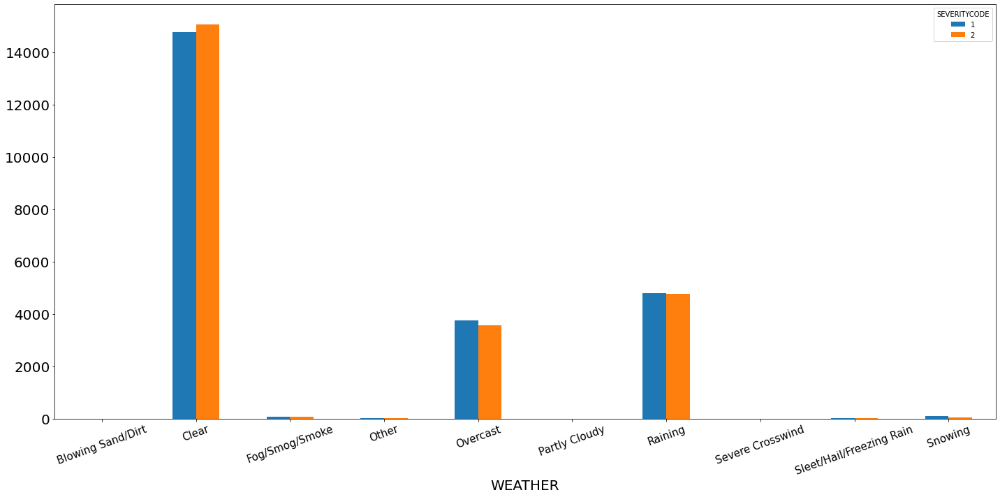

SEVERITYCODE       1      2
ROADCOND                   
Dry            16500  16789
Ice               95     59
Oil                3      4
Other              8      9
Sand/Mud/Dirt      7      4


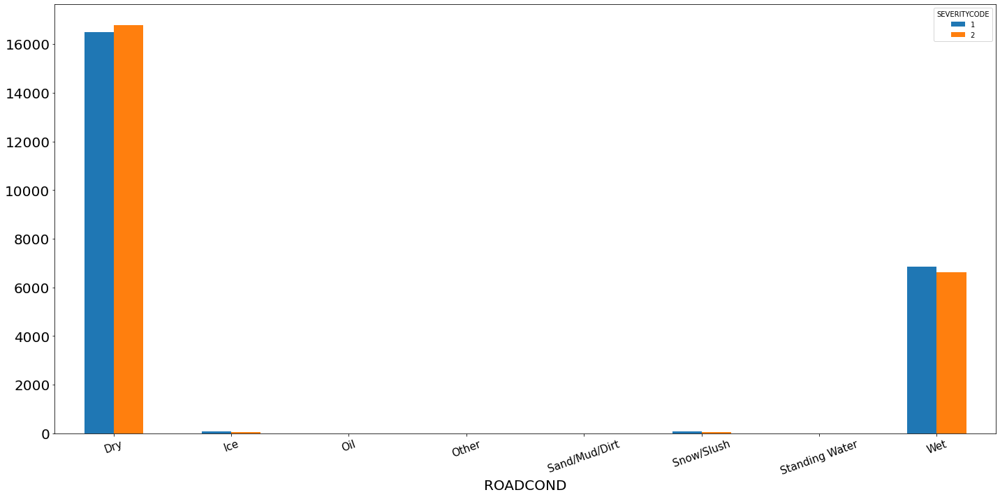

SEVERITYCODE                 1     2
LIGHTCOND                           
Dark - No Street Lights    129   104
Dark - Street Lights Off   127   140
Dark - Street Lights On   6231  5993
Dark - Unknown Lighting      1     3
Dawn                       321   371


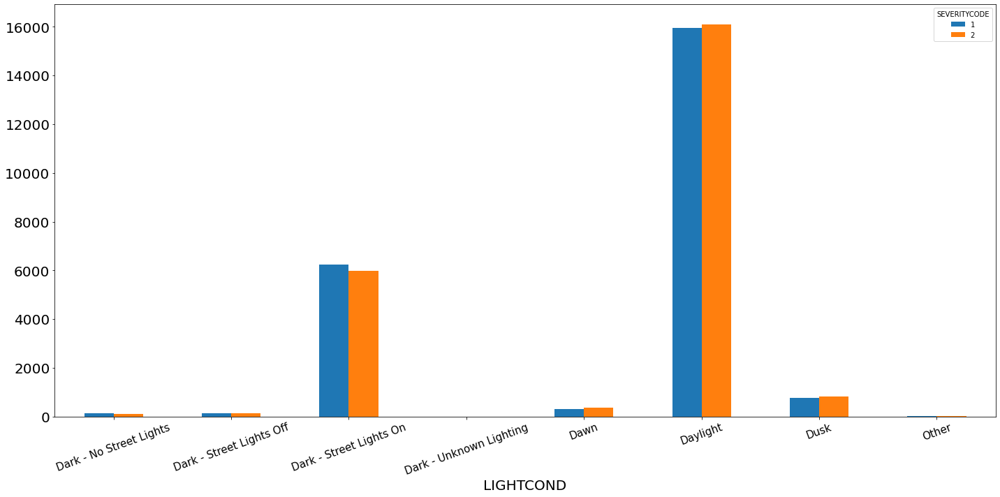

In [499]:
for i in C_C[['UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND']]:
       df=pd.concat([C_C[['SEVERITYCODE','X_index']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='X_index',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       
       TEST.plot(kind='bar',figsize=(20,10),stacked=False)
       plt.yticks(size=20)
       plt.xlabel(i,size=20)
       plt.xticks(size=15, rotation=20)
       plt.tight_layout()
       plt.savefig(i,size=(20,10))
       plt.show()

SEVERITYCODE       1      2
COLLISIONTYPE              
Angles         11269  10276
Cycles           227   2415
Head On          196    136
Left Turn       4505   3986
Other           1858    824


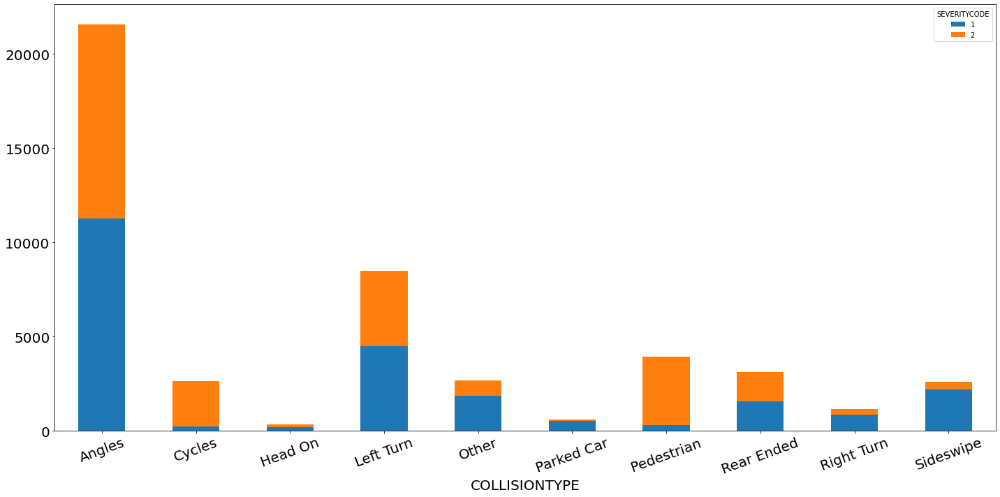

SEVERITYCODE                                             1        2
JUNCTIONTYPE                                                       
At Intersection (but not related to intersection)    872.0    544.0
At Intersection (intersection related)             22666.0  23000.0
Mid-Block (not related to intersection)                NaN      1.0
Ramp Junction                                         13.0      7.0
Unknown                                                1.0      NaN


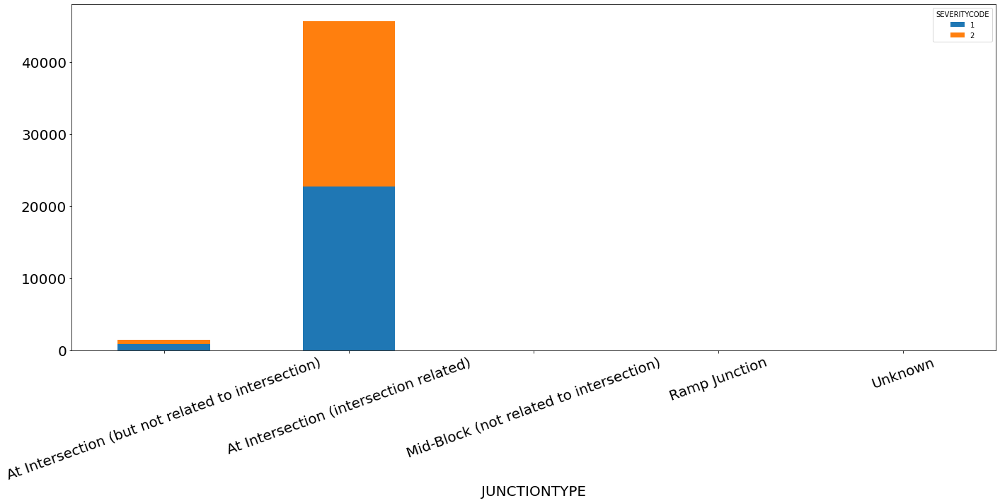

In [500]:
for i in C_C[['COLLISIONTYPE', 'JUNCTIONTYPE']]:
       df=pd.concat([C_C[['SEVERITYCODE','X_index']],C_C[i]],axis=1)
       #TEST=df.groupby([df.columns[2],df.columns[0]]).count().reset_index()
       TEST=pd.pivot_table(df,index=df.columns[2],columns=['SEVERITYCODE'],values='X_index',aggfunc='count')
       print(TEST.head())
       #print(TEST.pivot(index='SEVERITYCODE',columns=df.columns[1],values='HOUR'))
       
       TEST.plot(kind='bar',figsize=(20,10),stacked=True)
       plt.yticks(size=20)
       plt.xlabel(i,size=20)
       plt.xticks(size=20, rotation=20)
       plt.tight_layout()
       plt.savefig(i)
       plt.show()

In [501]:
ML_D=C_C
for col in ML_D:
    print(col,len(ML_D[col].unique()))
ML_D.head()

SEVERITYCODE 2
COLLISIONTYPE 10
JUNCTIONTYPE 5
SDOT_COLCODE 31
UNDERINFL 2
WEATHER 10
ROADCOND 8
LIGHTCOND 8
ST_COLCODE 96
MONTH 12
DAY 31
DOW 7
HOUR 24
X_index 2
Y_index 2
LOC_index 2
INTK_index 2
SEG_index 2
CROSS_index 2


,SEVERITYCODE,COLLISIONTYPE,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,MONTH,DAY,DOW,HOUR,X_index,Y_index,LOC_index,INTK_index,SEG_index,CROSS_index
0,2,Angles,At Intersection (intersection related),11,0.0,Overcast,Wet,Daylight,10,3,27,2,14.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2,Angles,At Intersection (intersection related),11,0.0,Raining,Wet,Daylight,10,1,28,2,8.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,4,20,5,17.0,1.0,1.0,1.0,1.0,1.0,1.0
3,2,Cycles,At Intersection (intersection related),51,0.0,Clear,Dry,Daylight,5,4,15,2,17.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2,Angles,At Intersection (intersection related),11,0.0,Clear,Dry,Daylight,10,3,20,0,15.0,1.0,1.0,1.0,1.0,1.0,1.0


In [502]:
C_C.head().to_csv('Clean.csv')



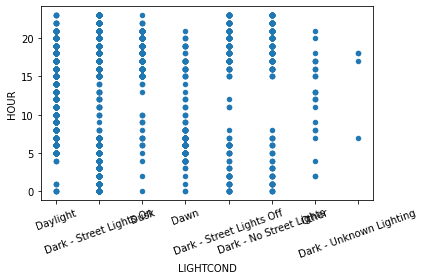

In [503]:
C_C.plot(kind='scatter',x='LIGHTCOND',y='HOUR')
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

In [505]:
#Preprocessing of train test_model
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
for col in ['COLLISIONTYPE','JUNCTIONTYPE','WEATHER', 'ROADCOND', 'LIGHTCOND']:
    tran=preprocessing.LabelEncoder()
    ML_D[col]=tran.fit_transform(ML_D[col])
#Normalize the data
ML_D.drop(columns=['X_index','Y_index','SDOT_COLCODE'],inplace=True)
for col in ML_D.columns[1:]:
    ML_D[col]=preprocessing.StandardScaler().fit(ML_D[[col]].values).transform(ML_D[[col]])
print(ML_D.head())
xtrain,xtest,ytrain,ytest=train_test_split(ML_D.iloc[:,1:],ML_D.iloc[:,0],test_size=0.2,random_state=4)
print(xtrain.shape,xtest.shape)
print(ytrain.shape,ytest.shape)

KeyError: "['X_index' 'Y_index' 'SDOT_COLCODE'] not found in axis"

In [506]:
from sklearn.neighbors import KNeighborsClassifier
all_score=[]
for k in range(1,30,2):
    KNN_yhat=KNeighborsClassifier(n_neighbors=k).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,KNN_yhat))
KNNscore=pd.DataFrame(all_score)
KNNscore.head()

,0,1,2,3
0,0.973142,0.986413,0.986388,17.229
1,0.657697,0.791046,0.793507,17.229
2,0.591749,0.739219,0.743521,17.229
3,0.564084,0.715150,0.721296,17.229
4,0.545254,0.699334,0.705714,17.229


JACC       ACC        F1  LogLoss
k                                       
1  0.973142  0.986413  0.986388   17.229
3  0.657697  0.791046  0.793507   17.229
5  0.591749  0.739219  0.743521   17.229
7  0.564084  0.715150  0.721296   17.229
9  0.545254  0.699334  0.705714   17.229
The max JACC is at 0.9731416880868698 with k=1
The max ACC is at 0.9864129713663986 with k=1
The max F1 is at 0.9863880470037751 with k=1


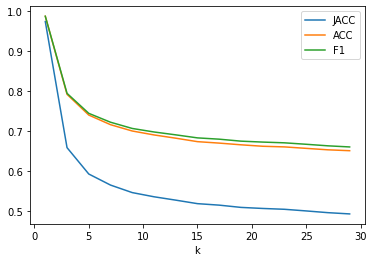

The min Logloss is at 17.229000077701656 with k=1


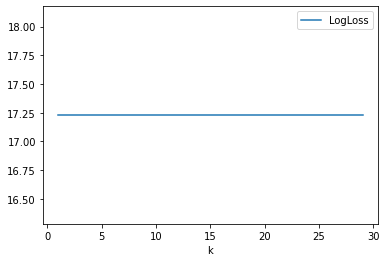

In [507]:
score=KNNscore
score['k']=list(range(1,30,2))
score.set_index('k',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(2*score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(2*score['LogLoss'].argmin()+1))
plt.show()

In [508]:
from sklearn.tree import DecisionTreeClassifier
all_score=[]
for d in range(1,10):
    DT_yhat=DecisionTreeClassifier(criterion='entropy',max_depth=d).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,DT_yhat))

DT_score=pd.DataFrame(all_score)

JACC       ACC        F1  LogLoss
d                                       
1  0.537117  0.576387  0.698862   17.229
2  0.537117  0.576387  0.698862   17.229
3  0.533278  0.600085  0.695605   17.229
4  0.559648  0.616113  0.717659   17.229
5  0.468453  0.637821  0.638022   17.229
The max JACC is at 0.5596481081245624 with k=4
The max ACC is at 0.6543799591327655 with k=9
The max F1 is at 0.7176594581934578 with k=4


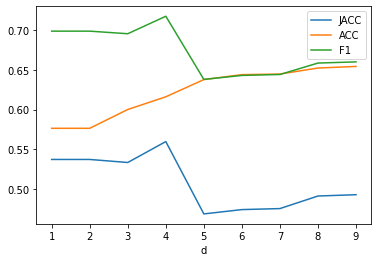

The min Logloss is at 17.229000077701656 with k=1


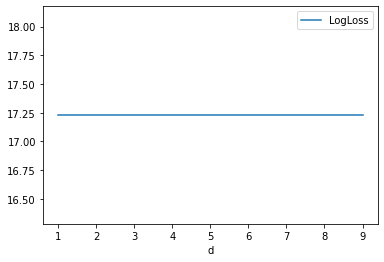

In [509]:
score=DT_score
score['d']=list(range(1,10))
score.set_index('d',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()


In [510]:
from sklearn import svm
ker=['linear','rbf','sigmoid']
all_score=[]
for i in ker:
    svc_yhat=svm.SVC(kernel=i).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,svc_yhat))
svc_score=pd.DataFrame(all_score)

JACC       ACC        F1  LogLoss
method                                        
linear   0.390254  0.556723  0.561414   17.229
rbf      0.486248  0.638643  0.654329   17.229
sigmoid  0.326597  0.493326  0.492383   17.229
The max JACC is at 0.4862478777589134 with k=2
The max ACC is at 0.6386434201098639 with k=2
The max F1 is at 0.6543294493945624 with k=2


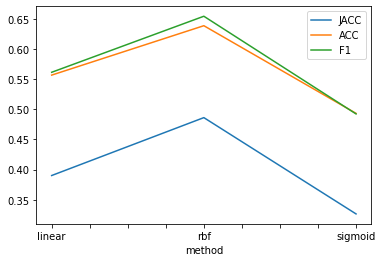

The min Logloss is at 17.229000077701656 with k=1


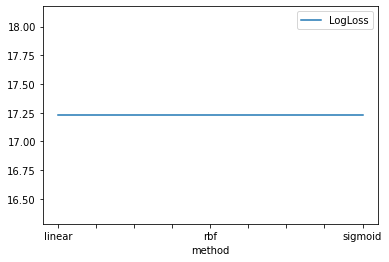

In [511]:
score=svc_score
score['method']=ker
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()

In [512]:
from sklearn.linear_model import LogisticRegression
solv=['newton-cg','lbfgs','liblinear','sag','saga']
all_score=[]
for i in solv:
    Log_yhat=LogisticRegression(C=0.01,solver=i).fit(xtrain,ytrain).predict(xtrain)
    all_score.append(JAF(ytrain,Log_yhat))
Log_score=pd.DataFrame(all_score)

JACC       ACC        F1  LogLoss
method                                          
newton-cg  0.406700  0.566223  0.578233   17.229
lbfgs      0.406686  0.566197  0.578218   17.229
liblinear  0.406671  0.566170  0.578203   17.229
sag        0.406700  0.566223  0.578233   17.229
saga       0.406686  0.566197  0.578218   17.229
The max JACC is at 0.4067003012594824 with k=1
The max ACC is at 0.5662234960061566 with k=1
The max F1 is at 0.5782330477861493 with k=1


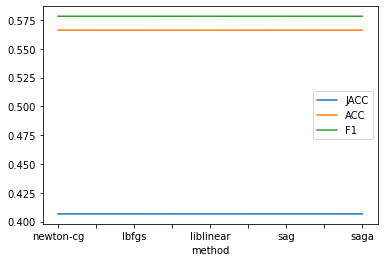

The min Logloss is at 17.229000077701656 with k=1


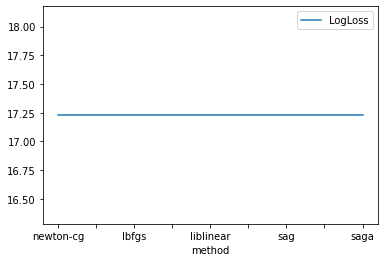

In [513]:
score=Log_score
score['method']=solv
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()

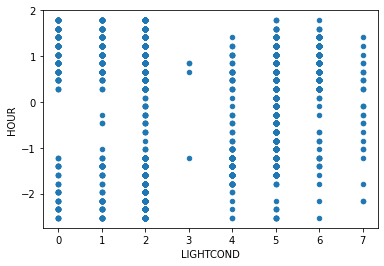

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
all_score=[]
for k in range(1,30,2):
    KNN_yhat=KNeighborsClassifier(n_neighbors=k).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,KNN_yhat))
KNNscore=pd.DataFrame(all_score)
KNNscore.head()

In [ ]:
score=KNNscore
score['k']=list(range(1,30,2))
score.set_index('k',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(2*score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(2*score['LogLoss'].argmin()+1))
plt.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier
all_score=[]
for d in range(1,10):
    DT_yhat=DecisionTreeClassifier(criterion='entropy',max_depth=d).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,DT_yhat))

DT_score=pd.DataFrame(all_score)

In [ ]:
score=DT_score
score['d']=list(range(1,10))
score.set_index('d',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()


In [ ]:
from sklearn import svm
ker=['linear','rbf','sigmoid']
all_score=[]
for i in ker:
    svc_yhat=svm.SVC(kernel=i).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,svc_yhat))
svc_score=pd.DataFrame(all_score)

In [ ]:
score=svc_score
score['method']=ker
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression
solv=['newton-cg','lbfgs','liblinear','sag','saga']
all_score=[]
for i in solv:
    Log_yhat=LogisticRegression(C=0.01,solver=i).fit(xtrain,ytrain).predict(xtest)
    all_score.append(JAF(ytest,Log_yhat))
Log_score=pd.DataFrame(all_score)

In [ ]:
score=Log_score
score['method']=solv
score.set_index('method',inplace=True)
score.columns=['JACC','ACC','F1','LogLoss']
print(score.head())
score[['JACC','ACC','F1']].plot(kind='line')
for i in ['JACC','ACC','F1']:
    print('The max '+i+' is at '+str(score[i].max())+' with k='+str(score[i].argmax()+1))
plt.show()
score[['LogLoss']].plot(kind='line')
print('The min Logloss is at '+str(score['LogLoss'].min())+' with k='+str(score['LogLoss'].argmin()+1))
plt.show()